# Action Recognition

#### Your objective is to construct action recognition models on a subset of the UCF101 dataset. The [UCF101 dataset](https://www.crcv.ucf.edu/data/UCF101.php) consists of a total of 13,320 videos spanning diverse human action categories. However, for the final project, our focus narrows down to a subset of the dataset, comprising 2,355 training videos and 969 test videos distributed among 30 action categories. You will have to build one binary classifier and one multi-class classifier.

## **1. Binary Classifier for JugglingBalls [[6 points]](https://)**
#### Build a classifier for the class *JugglingBalls*. Your goal is to train a model to classify JugglingBalls videos as *positive* and the remaining videos as *negative*. You are free to choose any machine learning models from the class.
#### **1-1. Hyper-parameter Search [[3 points]](https://).** Show your hyperparameter search process using cross-validation. Present at least for one hyper-parameter with 10 different possible values.
#### **1-2. Model Training and Testing [[3 points]](https://).** Then, train your model with the best combination of the hyper parameters and run the model on the test set, and submit the results to the Kaggle competition. To get full marks, your model should outperform the baseline model, which is provided in Kaggle. You **must** show your test performance score computed by Kaggle in this report.   


## **2. Multi-Class Classifier [[12 points]](https://)**
#### Build a multi-class classifier for all 30 action classes. Your goal is to train a model to classify videos into corresponding categories. You are free to choose any machine learning models from the class.
#### **2-1. Hyper-parameter Search [[4 points]](https://).** Demonstrate your hyperparameter search process using cross-validation. Provide details for at least one hyperparameter with 10 different possible values.
#### **2-2. Model Training and Testing [[4 points]](https://).** Following the hyperparameter search, train your model with the best combination of hyperparameters. Run the model on the test set and submit the results to the Kaggle competition. To get full marks, your model should outperform the baseline model, which is provided in Kaggle. You **must** show your test performance score computed by Kaggle in this report.   
#### **2-3. Model Analysis [[4 points]](https://).** Conduct a thorough analysis of your model, including:
#### **2-3-1. Confusion Matrix:** Split the training set into train/validation sets, and retrain your model using the best hyperparameter combination. Present the confusion matrix on the validation set.
#### **2-3-2. Example Examination:** Examine one validation sample where your model fails to classify into the correct category. Display the true label, top-5 predicted labels, and display the video you examined. You can use the provided function `video_to_gif()` to convert .avi files to .gif. Refer to the example below.



---

## **A. Data Download**
#### For your convenience, we have provided codes to download the dataset, which includes videos, true labels, and features.

#### **A-1. Download Features and Labels.**
#### Run the following code to download the features and the true labels of the videos. We extracted features from the [InceptionV3 model](https://arxiv.org/abs/1512.00567) that has been pre-trained on the [ImageNet-1k dataset](http://image-net.org/).
#### Frames are extracted from each video, and the pre-trained was used to obtain a 2048-D feature vector for every frame. We store the feature vectors for the first 20 frames. For example, you will find an array of shape (2355, 20, 2048) for `train_feature`, where the array contains features for 2,355 videos. Each video is represented by 20 frames, and each frame is encoded by a 2048-dimensional feature vector.
#### As each video is represented by a 20x2048 array, you may need to encode them into an N-dimensional vector. One approach is to  use only the feature vector for the first frame of each video.

In [1]:
import numpy as np
# !pip install gdown

In [2]:
#!gdown --id 1gO6BYxkNnnR7j_Iro4exIkpya91xVXhl # train feature
#!gdown --id 1zcW5v-Jdv0BWeCpu6yMY9vZbSy7Va6j5 # train label
#!gdown --id 1XY4wjqNwaZC8dFJNvtaXAA8oM9k7VBHm # test feature

with open('train_feature.npy', 'rb') as f:
  train_feature = np.load(f)
with open('train_label.npy', 'rb') as f:
  train_label = np.load(f)
with open('test_feature.npy', 'rb') as f:
  test_feature = np.load(f)

In [3]:
print('Shape of train_feature: {0}'.format(train_feature.shape))
print('Shape of train_label: {0}'.format(len(train_label)))
print('Shape of test_feature: {0}'.format(test_feature.shape))

Shape of train_feature: (2355, 20, 2048)
Shape of train_label: 2355
Shape of test_feature: (969, 20, 2048)


#### The labels of the videos are represented as strings. Since models cannot process strings, it is necessary to convert these labels into integers. We use the following `label_list` to map the class labels to integers. This same `label_list` can be used to interpret the model's predictions.

In [4]:
label_list = ['ApplyLipstick', 'BalanceBeam', 'BlowingCandles', 'BodyWeightSquats',
                    'BreastStroke', 'CleanAndJerk', 'CuttingInKitchen', 'Fencing',
                    'FieldHockeyPenalty', 'HandstandWalking', 'HighJump', 'JugglingBalls',
                    'JumpingJack', 'MoppingFloor', 'ParallelBars', 'PizzaTossing',
                    'PlayingPiano', 'PlayingTabla', 'PlayingViolin', 'PullUps',
                    'PushUps', 'Rafting', 'RopeClimbing', 'Skijet',
                    'SkyDiving', 'StillRings', 'SumoWrestling', 'TaiChi',
                    'UnevenBars', 'VolleyballSpiking']

#### **A-2. Download Videos.**
#### Run the following code to download the videos and the true label names of the videos. In `ucf101_subset_train.tar.gz`, you will find `train.csv` and the folder `./train/`.

In [5]:
# !gdown --id 1BC0KaP5OUrCAb10kaekN3iXrcfDQ_GU-
# !tar xf "ucf101_subset_train.tar.gz"

In [6]:
import pandas as pd
train_df = pd.read_csv("train.csv")
print(train_df)

                           video_name                tag
0         v_ApplyLipstick_g08_c01.avi      ApplyLipstick
1         v_ApplyLipstick_g08_c02.avi      ApplyLipstick
2         v_ApplyLipstick_g08_c03.avi      ApplyLipstick
3         v_ApplyLipstick_g08_c04.avi      ApplyLipstick
4         v_ApplyLipstick_g09_c01.avi      ApplyLipstick
...                               ...                ...
2350  v_VolleyballSpiking_g24_c04.avi  VolleyballSpiking
2351  v_VolleyballSpiking_g25_c01.avi  VolleyballSpiking
2352  v_VolleyballSpiking_g25_c02.avi  VolleyballSpiking
2353  v_VolleyballSpiking_g25_c03.avi  VolleyballSpiking
2354  v_VolleyballSpiking_g25_c04.avi  VolleyballSpiking

[2355 rows x 2 columns]


#### **A-3. Displaying Videos in Notebook.**
#### Below shows how to display a .avi file in this notebook.

In [7]:
from moviepy.editor import VideoFileClip

In [8]:
def video_to_gif(video_filename):
  videoClip = VideoFileClip(video_filename)
  gif_filename = '{0}.gif'.format(video_filename.split('/')[1])
  videoClip.write_gif(gif_filename)
  return gif_filename

BalanceBeam
train/v_BalanceBeam_g12_c03.avi
MoviePy - Building file v_BalanceBeam_g12_c03.avi.gif with imageio.


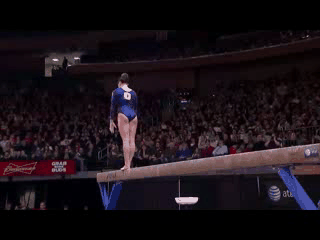

In [9]:
from IPython.display import Image
sample_filename = '/'.join(['train', train_df.loc[100, 'video_name']])
print(train_df.loc[100, 'tag'])
print(sample_filename)
gif_filename = video_to_gif(sample_filename) # convert an .avi file into a .gif file.
Image(open(gif_filename,'rb').read()) # display the gif file.

# 1. Binary Classifier

### Preprocess data

In [10]:
# Convert to binary label
train_label_bi = (train_label == label_list.index("JugglingBalls")).astype(int)

# Select 750 features out of 2048 features
random_selection = np.random.choice(len(train_feature), size=750, replace=False)
X_select = train_feature[random_selection,:, :]

# Select 4 frames out of 20
X_select = X_select[:, [1,7,13,17],:]
y_select_bi = train_label_bi[random_selection]
print('X_select: {0}'.format(X_select.shape))

# Flatten
X_select_flat = X_select.reshape(-1, X_select.shape[2])
print('X_select_flat: {0}'.format(X_select_flat.shape))

# Extend
y_select_bi_ex = np.repeat(y_select_bi, X_select.shape[1])
print('y_select_bi_ex: {0}'.format(y_select_bi_ex.shape))


X_select: (750, 4, 2048)
X_select_flat: (3000, 2048)
y_select_bi_ex: (3000,)


### Hyperparameter Search

In [11]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# Initialize
svc = SVC()

# Param grid: C with at least 10 different values
param_grid = {'C': [0.6, 0.7, 0.8, 0.9, 1, 1.1, 1.2, 1.3, 1.4, 1.5],
              'gamma': ['scale'],
              'kernel': ['poly']
              }

# Grid search
grid_search = GridSearchCV(estimator=svc, param_grid=param_grid)
grid_search.fit(X_select_flat, y_select_bi_ex)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)


Best hyperparameters: {'C': 1.2, 'gamma': 'scale', 'kernel': 'poly'}


### Train Model

In [12]:
# Flatten train features
train_feature_flat = train_feature.reshape(-1, train_feature.shape[2])
print('train_feature_flat: {0}'.format(train_feature_flat.shape))

# Extend train_labels
train_label_bi_ex = np.repeat(train_label_bi, train_feature.shape[1])
print('train_label_bi_ex: {0}'.format(train_label_bi_ex.shape))

# Best hyperparameters
svc = SVC(**best_params)
svc.fit(train_feature_flat, train_label_bi_ex)


train_feature_flat: (47100, 2048)
train_label_bi_ex: (47100,)


SVC(C=1.2, kernel='poly')

### Test

In [13]:
# Flatten test features
test_feature_flat = test_feature.reshape(-1, test_feature.shape[2])

# Predict
test_pred = svc.predict(test_feature_flat)

# Reshape
test_pred = test_pred.reshape(test_feature.shape[0], test_feature.shape[1])


### Kaggle

In [14]:
# Whether each sample has at least one positive prediction
binary_pred = np.squeeze(np.apply_along_axis(lambda x: 1 if np.sum(x) > 0 else 0, axis=1, arr=test_pred))

num_test = len(binary_pred)

# Kaggle submission format
test_submission = pd.DataFrame({
    'id':list(range(num_test)),
    'predicted':list(binary_pred.astype('int32'))})
test_submission.to_csv('COSC274_Binary_Kaggle_IY.csv', index=False)

# Visualization
print("test_submission.shape", test_submission.shape)
test_submission.head()


test_submission.shape (969, 2)


,id,predicted
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


My Kaggle score is 0.82500, which outperformed the baseline.

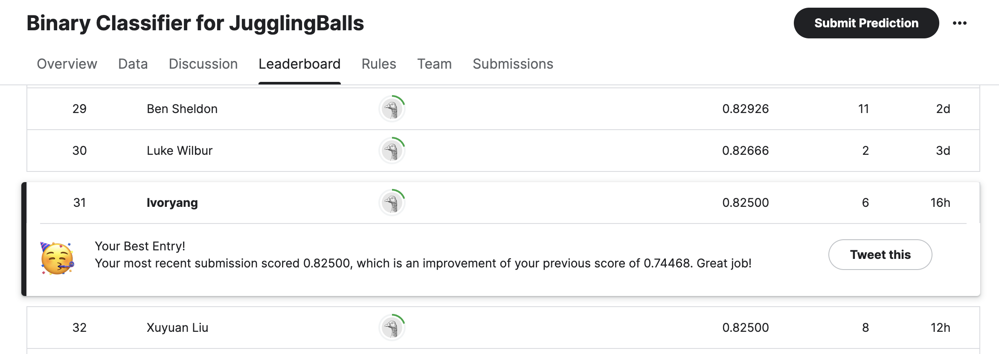

# Multivariable Classifier

### Preprocess Data

In [15]:
# Select 750 features out of 2048 features
random_selection = np.random.choice(len(train_feature), size=750, replace=False)
X_select = train_feature[random_selection,:, :]

# Select 4 frames out of 20
X_select = X_select[:, [1,7,13,17],:]
y_select = train_label[random_selection]
print('X_select: {0}'.format(X_select.shape))

# Reshape
X_select_flat = X_select.reshape(-1, X_select.shape[2])
print('X_select_flat: {0}'.format(X_select_flat.shape))

# Extend
y_select_ex = np.repeat(y_select, X_select.shape[1])
print('y_select_ex: {0}'.format(y_select_ex.shape))

X_select: (750, 4, 2048)
X_select_flat: (3000, 2048)
y_select_ex: (3000,)


### Hyperparameter Search

In [16]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# Initialize
svc = SVC()

# Param grid: At least 10 different values for C
param_grid = {'C': [0.001, 0.003, 0.005, 0.007, 0.009, 0.01, 0.013, 0.015, 0.017, 0.019],
              'gamma': ['scale'],
              'kernel': ['linear']
              }

# Grid search
grid_search = GridSearchCV(estimator=svc, param_grid=param_grid)
grid_search.fit(X_select_flat, y_select_ex)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)


Best hyperparameters: {'C': 0.003, 'gamma': 'scale', 'kernel': 'linear'}


### Model Training

In [17]:
# Flatten train features
train_feature_flat = train_feature.reshape(-1, train_feature.shape[2])
print('train_feature_flat: {0}'.format(train_feature_flat.shape))

# Extend train_labels
train_label_ex = np.repeat(train_label, train_feature.shape[1])
print('train_label_ex: {0}'.format(train_label_ex.shape))

# Apply best hyperparameters
svc = SVC(**best_params)
svc.fit(train_feature_flat, train_label_ex)


train_feature_flat: (47100, 2048)
train_label_ex: (47100,)


SVC(C=0.003, kernel='linear')

### Testing

In [18]:
# Flatten test features
test_feature_flat = test_feature.reshape(-1, test_feature.shape[2])

# Predict
test_pred = svc.predict(test_feature_flat)

# Reshape test_pred
test_pred = test_pred.reshape(test_feature.shape[0], test_feature.shape[1])


### Kaggle

In [19]:
# Combine predictions
multi_pred = np.squeeze(np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=1, arr=test_pred))

# Number
num_test = len(multi_pred)

# Kaggle submission structure
test_submission = pd.DataFrame({
    'id':list(range(num_test)),
    'predicted':list(multi_pred.astype('int32'))})
test_submission.to_csv('COSC274_Multi_Kaggle_IY', index=False)

# Visualize
print("test_submission.shape", test_submission.shape)
test_submission.head()


test_submission.shape (969, 2)


,id,predicted
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


My Kaggle score was 0.80495, which outperformed the baseline.

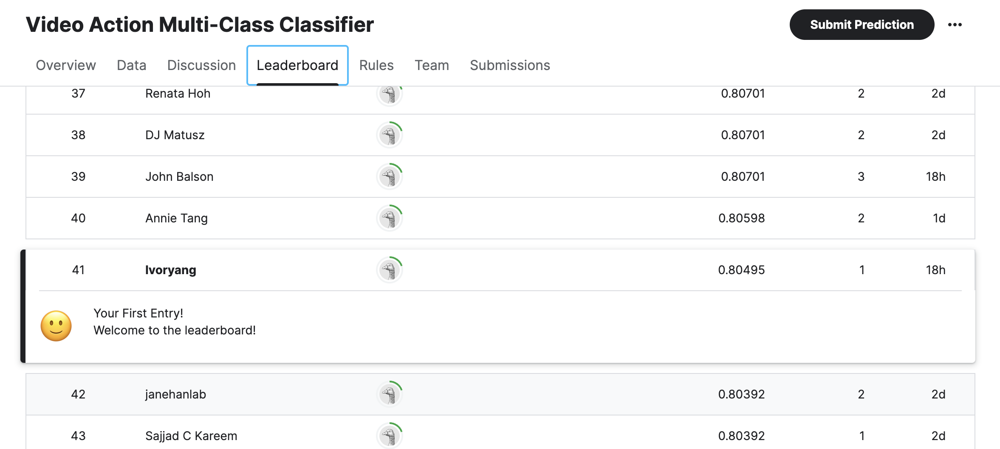


### Split

In [20]:
from sklearn.model_selection import train_test_split

# Initialize array of indices, then shuffle
indices = np.arange(len(train_feature))
np.random.shuffle(indices)

# Split into train / val
train_indices, test_indices = train_test_split(indices, test_size=0.2, shuffle=False)

X_train_sp = train_feature[train_indices]
y_train_sp = train_label[train_indices]
X_val = train_feature[test_indices]
y_val = train_label[test_indices]

# Flatten
X_train_sp_flat = X_train_sp.reshape(-1, X_train_sp.shape[2])

# Extend
y_train_sp_ex = np.repeat(y_train_sp, X_train_sp.shape[1])


### Retrain

In [21]:
# Retrain
svm = SVC(**best_params)
svm.fit(X_train_sp_flat, y_train_sp_ex)

# Flatten
X_val_flat = X_val.reshape(-1, X_val.shape[2])

# Predict
val_pred = svm.predict(X_val_flat)

# Reshape to original
val_pred = val_pred.reshape(X_val.shape[0], X_val.shape[1])

# Combine all predictions
val_pred_combi = np.squeeze(np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=1, arr=val_pred))


### Confusion Matrix

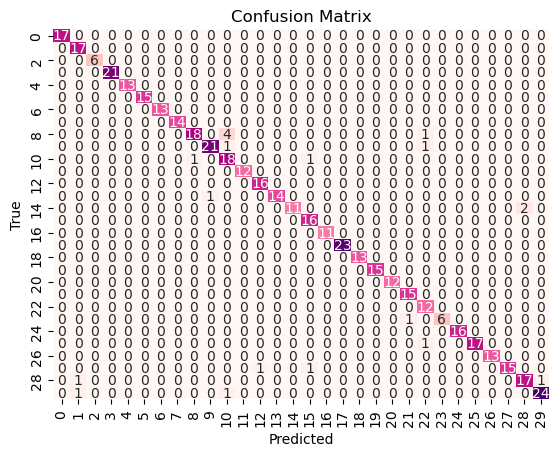

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Confusion Matrix
c_m = confusion_matrix(y_val, val_pred_combi)

# Plot
sns.heatmap(c_m, annot=True, cmap='RdPu', fmt='g', cbar=False)
# Properties
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

# Visualization
plt.show()


### Example Examination

In [29]:
# Initialize target index
target_index = 0

# Iterate
for index, pred in enumerate(val_pred_combi):
    # Check for mismatch
    if pred != y_val[index]:
        # Add to target index and break loop
        target_index = index
        break
        
# Retrieve predictions corresponding to identified target index
pred = val_pred[target_index]

# Get unique values and their counts in the preds array
unique_val, count = np.unique(pred, return_counts=True)

# Create a dictionary mapping unique values to their counts
count_d = dict(zip(unique_val, count))

# Sort in descending
count_sorted = sorted(count_d.items(), key=lambda x: x[1], reverse=True)


### Generate and Visualize

True Label: FieldHockeyPenalty
Top Five Predicted Labels: ['HighJump']

========   The examined video:
MoviePy - Building file v_FieldHockeyPenalty_g18_c04.avi.gif with imageio.


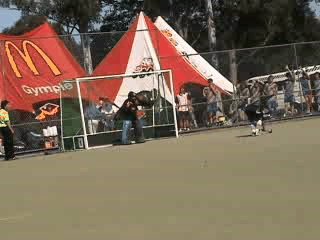

In [33]:
# Print the true label corresponding to the target index
print("True Label:", label_list[y_val[target_index][0]])

# Print the top five predicted labels and their counts
print("Top Five Predicted Labels:", [label_list[idx] for idx, count in count_sorted])
print()

# Retrieve the original index of the examined video in the concatenated dataset
og_index = indices[len(X_train_sp) + target_index]

# Print out the original images section header
print("=" * 8, "  The examined video:")

# Import the Image class from IPython.display to display images in the Jupyter Notebook
from IPython.display import Image

# Construct the sample filename by extracting the video name from the training dataframe
sample_filename = '/'.join(['train', train_df.loc[og_index, 'video_name']])

# Convert the video file (.avi) to a gif file and get the filename
gif_filename = video_to_gif(sample_filename)

# Display the gif file in the Jupyter Notebook
Image(open(gif_filename, 'rb').read())


The video is predicted as hgih jump even though it is actually a video of a field hockey penalty. This mistaken classification could be because the goalie makes a small jump for the goal and falls - the goalie's actions confuse the model and predict that this is a video of a high jump even though it is not.